In [ ]:
!pip install psaw
!pip install wordcloud
import os
from psaw import PushshiftAPI
import pandas as pd
import numpy as np
import datetime
import matplotlib.pyplot as plt
from tqdm import tqdm
import datetime
import pickle as pkl
from wordcloud import WordCloud
import nltk
import re
from PIL import Image


DATA_FOLDER = 'reddit_data'
RAW_DATA_FILENAME = os.path.join(DATA_FOLDER, 'HP_raw_data.csv')
PROCESSED_FILENAME = os.path.join(DATA_FOLDER, 'HP_processed_data.csv')
AUTHOR_SUBREDDIT_FILENAME = os.path.join(DATA_FOLDER, 'HP_author_subreddit_data.csv')
AUTHOR_POSTS_FILENAME = os.path.join(DATA_FOLDER, 'HP_chosen_author_posts_data.csv')

You should consider upgrading via the '/root/venv/bin/python -m pip install --upgrade pip' command.
You should consider upgrading via the '/root/venv/bin/python -m pip install --upgrade pip' command.


In [ ]:
if not os.path.isdir(DATA_FOLDER):
    os.mkdir(DATA_FOLDER)

# Downloading Reddit Data

First we download data from the r/harrypotter subreddit

In [ ]:
api = PushshiftAPI()

In [ ]:
if os.path.exists(RAW_DATA_FILENAME):
    print('Loading existing raw data')
    df_submissions = pd.read_csv(RAW_DATA_FILENAME)
    print('Loaded raw data')
else:
    my_subreddit = "harrypotter"
    date1 = int(datetime.datetime(2021, 1, 1).timestamp())
    date2 = int(datetime.datetime(2021, 3, 25).timestamp())
    #query = "Gryffindor"

    gen = api.search_submissions(subreddit = my_subreddit,
                                after = date1,
                                before = date2)

    results = list(gen)

    df_submissions = pd.DataFrame([(p.d_["title"], 
                        p.d_["id"], 
                        p.d_["score"], 
                        p.d_["created_utc"],
                        datetime.datetime.utcfromtimestamp(p.d_["created_utc"]).strftime("%Y-%m-%d"),
                        p.d_["author"],
                        p.d_["num_comments"],
                        p.d_["author_flair_css_class"]) 
                        for p in results], 
                        columns = ["title", "id", "score", "created_utc", "creation_date", "author", "num_comments", 
                        "house_id"])

    # remove entries with no house
    df_submissions = df_submissions.dropna().reset_index(drop=True)

Loading existing raw data
Loaded raw data


In [ ]:
df_submissions

,title,id,score,created_utc,creation_date,author,num_comments,house_id
0,...........................,m74y28,1,1616000255,2021-03-17,xindiliu13,0,RVM1
1,I drew Harry as Head Auror!,m74xkg,1,1616000219,2021-03-17,arishatistic,1,HF4
2,"I know it's only said in the film, but this qu...",m74kin,1,1615999241,2021-03-17,MrRandomEncounter,1,HF1
3,Order of the Phoenix’s Dumbledore’s office sce...,m74asb,1,1615998526,2021-03-17,rebel_child12,0,SL2
4,missing Hogwarts 😓 potions would be my fav cla...,m746s7,1,1615998227,2021-03-17,orangemango56,3,GR1
...,...,...,...,...,...,...,...,...
2912,Question about Tom Riddle's Memory in Chamber ...,ko3izm,1,1609468964,2021-01-01,flackboxessanta,2,RV
2913,TRIVIA RESULTS - Salazar's Tue Dec 22 Harry Po...,ko2zpz,1,1609466698,2021-01-01,Marx0r,0,SL
2914,Best of r/harrypotter 2020 Nominations and Vot...,ko2ve1,1,1609466247,2021-01-01,ibid-11962,96,RCT
2915,WizCARDS - December Results,ko2jqy,1,1609464958,2021-01-01,BottleOfAlkahest,16,SL1


In [ ]:
# Save raw data to csv, so we don't have to fetch it again
if not os.path.exists(RAW_DATA_FILENAME):
    print('Saving raw data file..')
    df_submissions.to_csv(RAW_DATA_FILENAME, index=False)
    print(f'Raw data saved to {RAW_DATA_FILENAME}')

# Preprocessing Data
We now preprocess the raw data from r/harrypotter

First we add a _house_ attribute to the submissions dataframe containing the name of the Hogwarts House of the user

In [ ]:
house_id = 'house_id'
if os.path.exists(PROCESSED_FILENAME):
    df_submissions = pd.read_csv(PROCESSED_FILENAME)
else:
    # Preprocess
    df_submissions["house"] = df_submissions[house_id].apply(lambda x: 'Gryffindor' if 'GR' in x
                                                                else 'Slytherin' if 'SL' in x
                                                                else 'Hufflepuff' if 'HF' in x
                                                                else 'Ravenclaw' if 'RV' in x
                                                                else None
    )

    # Drop nodes with non of the four houses
    df_submissions.dropna(subset=['house']).reset_index(drop=True, inplace=True)

    df_submissions.to_csv(PROCESSED_FILENAME, index=False)

In [ ]:
df_submissions

,title,id,score,created_utc,creation_date,author,num_comments,house_id,house
0,...........................,m74y28,1,1616000255,2021-03-17,xindiliu13,0,RVM1,Ravenclaw
1,I drew Harry as Head Auror!,m74xkg,1,1616000219,2021-03-17,arishatistic,1,HF4,Hufflepuff
2,"I know it's only said in the film, but this qu...",m74kin,1,1615999241,2021-03-17,MrRandomEncounter,1,HF1,Hufflepuff
3,Order of the Phoenix’s Dumbledore’s office sce...,m74asb,1,1615998526,2021-03-17,rebel_child12,0,SL2,Slytherin
4,missing Hogwarts 😓 potions would be my fav cla...,m746s7,1,1615998227,2021-03-17,orangemango56,3,GR1,Gryffindor
...,...,...,...,...,...,...,...,...,...
2844,Of course it’s all happening in your head...,ko3zjs,1,1609470928,2021-01-01,4parkerlane,15,RV5,Ravenclaw
2845,Question about Tom Riddle's Memory in Chamber ...,ko3izm,1,1609468964,2021-01-01,flackboxessanta,2,RV,Ravenclaw
2846,TRIVIA RESULTS - Salazar's Tue Dec 22 Harry Po...,ko2zpz,1,1609466698,2021-01-01,Marx0r,0,SL,Slytherin
2847,WizCARDS - December Results,ko2jqy,1,1609464958,2021-01-01,BottleOfAlkahest,16,SL1,Slytherin


# Selecting User Nodes
We now want to select user nodes from the r/harrypotter subreddit that we know have posts on other subreddit forums

In [ ]:
def get_author_subreddits(authors):
    date1 = int(datetime.datetime(2021, 1, 1).timestamp())
    date2 = int(datetime.datetime(2021, 3, 25).timestamp())

    gen = api.search_submissions(author=authors,
                                after = date1,
                                before = date2,
                                filter=['author', 'subreddit', 'subreddit_id'])

    results = list(gen)

    author_subreddits = pd.DataFrame([(p.d_["author"], 
                        p.d_["subreddit"], 
                        p.d_["subreddit_id"]) 
                        for p in results], 
                        columns = ["author", "subreddit", 'subreddit_id'])

    # remove entries with no house
    return author_subreddits

In [ ]:
# Looking at top X authors from r/harrypotter to not get time out from Pushshift
X=100
submissions_by_author = df_submissions.groupby('author').sum()
top_X_submissions = submissions_by_author.sort_values(by='num_comments', ascending=False).head(X).reset_index()
print(f'{len(top_X_submissions)} authors')
top_X_submissions

100 authors


,author,score,created_utc,num_comments
0,200020124,37099,146716861896,2050
1,Vocadofries,6259,4841387441,1384
2,EquivalentInflation,26,17736735812,1273
3,toreadornotto,47,20976903241,1273
4,coolbean36,68,20981076216,1204
...,...,...,...,...
95,AlbusDumbledore91,12,6448731682,101
96,hurshy238,21,12891319471,101
97,Bubbles_The_Defender,4,4846970491,99
98,please_liste,10,19337333294,99


In [ ]:
authors = top_X_submissions['author']
if os.path.exists(AUTHOR_SUBREDDIT_FILENAME):
   author_subreddits = pd.read_csv(AUTHOR_SUBREDDIT_FILENAME)
else:
    author_subreddits = get_author_subreddits(authors)
    author_subreddits.to_csv(AUTHOR_SUBREDDIT_FILENAME, index=False)

In [ ]:
author_subreddits.sort_values(by='author')

,author,subreddit,subreddit_id
1798,200020124,harrypotter,t5_2qiqi
1146,200020124,AskReddit,t5_2qh1i
2880,200020124,memes,t5_2qjpg
226,200020124,harrypotter,t5_2qiqi
3467,200020124,harrypotter,t5_2qiqi
...,...,...,...
1342,urmomagayy,AskReddit,t5_2qh1i
1419,urmomagayy,teenagers,t5_2rjli
1557,urmomagayy,teenagers,t5_2rjli
1145,urmomagayy,teenagers,t5_2rjli


In [ ]:
# Unique subreddits for each selected r/harrypotter author
unique_sub_reddits = author_subreddits.groupby('author').nunique().sort_values(by='subreddit', ascending=False)
unique_sub_reddits

,subreddit,subreddit_id
author,,
Bleepbloopbotz2,54,54
PeevesPoltergist,53,53
SirAren,49,49
Ok_Fennel6151,42,42
RunningTURTL,41,41
...,...,...
artist_demetra,1,1
Vadermort97,1,1
Dharaneeswaran,1,1


In [ ]:
limit = 20 # Different subreddits
chosen_users = unique_sub_reddits[unique_sub_reddits['subreddit'] >= limit]
chosen_users

,subreddit,subreddit_id
author,,
Bleepbloopbotz2,54,54
PeevesPoltergist,53,53
SirAren,49,49
Ok_Fennel6151,42,42
RunningTURTL,41,41
EquivalentInflation,41,41
SkootNasty,36,36
M-Saga,35,35
Psychological-Fall57,31,31


In [ ]:
chosen_users = chosen_users.index

# We now want to get comments and submissions from the chosen users

In [ ]:
def get_author_posts(author):
    date1 = int(datetime.datetime(2021, 1, 1).timestamp())
    date2 = int(datetime.datetime(2021, 3, 25).timestamp())

    submissions = api.search_submissions(author=author,
                                after = date1,
                                before = date2,
                                filter=['author', 'subreddit', 'title', 'selftext', 'id', 'created_utc'])

    submission_results = list(submissions)

    for s in submission_results:
        s.d_['link_id'] = ''
        s.d_['parent_id'] = ''
        s.d_['text'] = s.d_['title'] + s.d_['selftext']

    comments = api.search_comments(author=author,
                                after = date1,
                                before = date2,
                                filter=['author', 'subreddit', 'body', 'id', 'link_id', 'parent_id', 'created_utc'])

    comment_results = list(comments)
    for c in comment_results:
        c.d_['text'] = c.d_['body']

    author_posts = pd.DataFrame([(
                        p.d_["id"],
                        p.d_["author"], 
                        p.d_["subreddit"], 
                        p.d_["text"],
                        p.d_["link_id"],
                        p.d_["parent_id"],
                        p.d_["created_utc"]) 
                        for p in (submission_results + comment_results)], 
                        columns = ["id", "author", 'subreddit', 'text', 'link_id', 'parent_id', 'created_utc'])
    return author_posts

In [ ]:
if os.path.exists(AUTHOR_POSTS_FILENAME):
    author_posts = pd.read_csv(AUTHOR_POSTS_FILENAME)
else:
    author_posts = get_author_posts(chosen_users[0])
    for user in tqdm(chosen_users[1:]):
        posts = get_author_posts(user)
        author_posts = pd.concat([author_posts, posts], ignore_index=True)
    author_posts.to_csv(AUTHOR_POSTS_FILENAME, index=False)


author_posts

 93%|█████████▎| 14/15 [03:14<00:10, 10.48s/it]/root/venv/lib/python3.8/site-packages/psaw/PushshiftAPI.py:192: UserWarning: Got non 200 code 525
  warnings.warn("Got non 200 code %s" % response.status_code)
/root/venv/lib/python3.8/site-packages/psaw/PushshiftAPI.py:180: UserWarning: Unable to connect to pushshift.io. Retrying after backoff.
  warnings.warn("Unable to connect to pushshift.io. Retrying after backoff.")
100%|██████████| 15/15 [03:28<00:00, 13.88s/it]


,id,author,subreddit,text,link_id,parent_id,created_utc
0,m6jt89,Bleepbloopbotz2,HPSlashFic,Can you guys rec some fics featuring a hot Ron ?,,,1615929815
1,m6diek,Bleepbloopbotz2,SocialJusticeInAction,In response to people being turned off a fanfi...,,,1615913432
2,m54ane,Bleepbloopbotz2,camphalfblood,"If the PJO series is a BIG success, how do you...",,,1615756091
3,m4vsxk,Bleepbloopbotz2,HPSlashFic,Who should I pair Draco with in my Harry/Ron f...,,,1615731305
4,m3svoh,Bleepbloopbotz2,HPfanfiction,Sirius gets a trial... and is found guilty.I t...,,,1615588158
...,...,...,...,...,...,...,...
11137,gj7rxh6,theweirdpotayytoo,WhatsWrongWithYourDog,In this context cancer is what is wrong with y...,t3_kwzmkh,t3_kwzmkh,1610620485
11138,gj5v0sm,theweirdpotayytoo,teenagers,Happy birthday,t3_kwgyx8,t3_kwgyx8,1610576237
11139,gixofgm,theweirdpotayytoo,teenagers,Me born on june 6 2006,t3_kv896t,t3_kv896t,1610404335
11140,giszkpa,theweirdpotayytoo,LesbianSexPorn,Who are they?,t3_ks4zo6,t3_ks4zo6,1610316217


# Finding Word Clouds for the selected users

In [ ]:
nltk.download('punkt')
nltk.download('stopwords')
from nltk.corpus import stopwords
from nltk import word_tokenize

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


First we tokenize and clean the text of the users' posts

In [ ]:
SW = stopwords.words("english")

In [ ]:
sub_tokens = []
for text in tqdm(author_posts["text"]):
    # remove urls
    text = [w for w in text.split(" ") if not re.search(r"[/ \\]", w)]
    #get tokens

    tokens = [token.lower() for token in word_tokenize(" ".join(text)) 
              if token.lower() not in SW
             and token.isalpha()]
    sub_tokens.append(tokens)
    
author_posts["tokens"] = sub_tokens

100%|██████████| 11142/11142 [00:05<00:00, 2077.57it/s]


Then we create documents for the user posts

In [ ]:
def concat(series):
    document = []
    for tokens in series:
        document.extend(tokens)
    
    return document

author_text_docs = author_posts.groupby('author')['tokens'].apply(lambda x: concat(x))

Now we can calculate the TF-IDF

In [ ]:
TF = []
for user in chosen_users:
    N = len(author_text_docs[user])
    freqdist = nltk.FreqDist(author_text_docs[user])
    tf = {word: round(count/N,5) for word, count in list(freqdist.most_common())}
    tf = nltk.FreqDist(tf)
    TF.append(tf)

for i, tf in enumerate(TF):
    word, _ = zip(*tf.most_common(5))
    print(f"{chosen_users[i]}: \t {word}")

terms = set().union(*[author_text_docs[user] for user in chosen_users])
N_docs = 16 # 15 stocks + other
all_users = list(author_text_docs.reset_index()['author'].values)
user_sets = [set(author_text_docs[user]) for user in all_users]

print('Calculating IDF...')
IDF = {}
for term in tqdm(terms):
    idf = np.log(N_docs/sum([term in user_set for user_set in user_sets]))
    IDF[term] = idf

print('Calculating TF-IDF...')
TF_IDF = []
for tf in TF:
    tf_idf = nltk.FreqDist({word:count * IDF[word] for word, count in tf.most_common() if IDF[word] > 0})
    TF_IDF.append(tf_idf)

for i, tf_idf in enumerate(TF_IDF):
    print(chosen_users[i])
    word_tf, _ = zip(*TF[i].most_common(10))
    print(f"{'Top 10 TF Words:':<30s}{word_tf}")
    word_tfidf, _ = zip(*tf_idf.most_common(10))
    print(f"{'Top 10 TF-IDF Words:':<30s}{word_tfidf}")
    print(f"{'Common words:':<30s}{set(word_tf).intersection(set(word_tfidf))}")
    print("\n")

100%|██████████| 17688/17688 [00:00<00:00, 208989.15it/s]Bleepbloopbotz2: 	 ('gt', 'harry', 'ron', 'like', 'hermione')
PeevesPoltergist: 	 ('gt', 'lt', 'pop', 'hello', 'like')
SirAren: 	 ('amp', 'like', 'movies', 'great', 'film')
Ok_Fennel6151: 	 ('like', 'avatar', 'show', 'would', 'korra')
RunningTURTL: 	 ('like', 'would', 'think', 'u', 'get')
EquivalentInflation: 	 ('people', 'like', 'would', 'also', 'one')
SkootNasty: 	 ('cover', 'curtis', 'lovejoy', 'original', 'thought')
M-Saga: 	 ('game', 'update', 'iphone', 'thanks', 'connect')
Psychological-Fall57: 	 ('like', 'think', 'really', 'character', 'would')
coolguydude56: 	 ('people', 'god', 'like', 'israel', 'one')
datavinci: 	 ('u', 'lol', 'like', 'would', 'gt')
coolbean36: 	 ('chocolatefrog', 'like', 'get', 'would', 'got')
Vocadofries: 	 ('like', 'people', 'one', 'would', 'get')
LiopleurodonMagic: 	 ('like', 'really', 'people', 'get', 'know')
amit0k: 	 ('day', 'national', 'one', 'would', 'like')
theweirdpotayytoo: 	 ('think', 'im', 

Then we can create the world clouds from the TF-IDF

In [ ]:
title_color = {
    'Gryffindor': 'red',
    'Slytherin': 'green',
    'Hufflepuff': 'yellow',
    'Ravenclaw': 'blue'
}
shield_mask = np.array(Image.open('wordcloud_contours/shield_contour.jpg'))

def create_wordclouds(users, height):
    width = int(len(users)/height)
    fig, ax = plt.subplots(height,width, dpi = 300, figsize = (20,30))
    titles = users
    font = {'family': 'serif',
            'weight': 'normal',
            'size': 20,
            }

    i = 0    
    for col in tqdm(range(width)):
        for row in tqdm(range(height)):
            user = users[i]
            user_house = df_submissions[df_submissions['author'] == user]['house'].iloc[0]
            user_color = title_color[user_house]
            wordcloud = WordCloud(width = 400*width,
                        height = 400*height,
                        max_words=100,
                        background_color ='white',
                        mask=shield_mask,
                        contour_width=3,
                        contour_color=user_color).generate_from_frequencies(dict(TF_IDF[i]))
            ax[row,col].imshow(wordcloud, interpolation='bilinear')
            ax[row,col].set_axis_off()
            ax[row,col].set_title(titles[i], fontdict = font)
            i += 1
        

    plt.show()

100%|██████████| 3/3 [00:20<00:00,  6.73s/it]


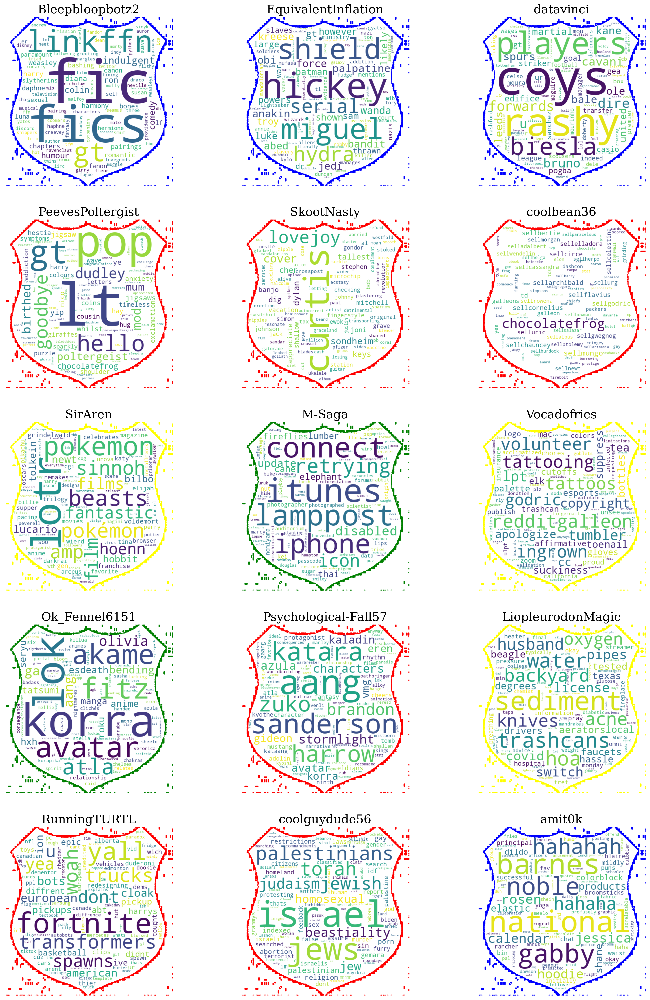

In [ ]:
create_wordclouds(chosen_users, height=5)

<a style='text-decoration:none;line-height:16px;display:flex;color:#5B5B62;padding:10px;justify-content:end;' href='https://deepnote.com?utm_source=created-in-deepnote-cell&projectId=85fb65b4-b596-4730-837e-04e86eafe419' target="_blank">
 </img>
Created in <span style='font-weight:600;margin-left:4px;'>Deepnote</span></a>